# Chosen Products

In [ ]:
products = ["Soybeans", "Rubber_natural_dry", "Wine", "Pigeons,_other_birds"]


# Andrew's Approach

## Process Data

In [ ]:
import networkx as nx
import pandas as pd

layerdict = {}
nodedict = {}
graphs = {}

with open('fao_trade_layers.txt','r') as l:
  next(l)
  for line in l:
    parts = line.strip().split(' ', 1)
    if len(parts) == 2:
      layerID, layerLabel = parts
      layerdict[int(layerID)] = layerLabel

with open('fao_trade_nodes.txt','r') as l:
  next(l)
  for line in l:
    parts = line.strip().split(' ', 1)
    if len(parts) == 2:
      nodeID, nodeLabel = parts
      nodedict[int(nodeID)] = nodeLabel

with open('fao_trade_multiplex.edges', 'r') as f:
  for line in f:
    parts = line.strip().split()
    if len(parts) != 4:
      continue
    layer = layerdict[int(parts[0])]
    node1 = int(parts[1])
    node2 = int(parts[2])
    weight = float(parts[3])

    if layer not in graphs:
      graphs[layer] = nx.DiGraph()

    graphs[layer].add_edge(nodedict[node1], nodedict[node2], weight=weight)

#access each layer's network by graphs[food_product_name], ex: graphs["Peppermint"]

# Aashay's Analysis

## Centrality

### Calculation

#### In-Strength, Out-Strength, Export-Import Ratio

In [ ]:
import pandas as pd


in_out_strengths = dict()

for product in graphs.keys():
  df = pd.DataFrame(columns = ["Country", "In-Strength", "Out-Strength", "Export-Import Ratio"])
  G = graphs[product]
  for node in G.nodes:
      # In-strength: sum of weights all incoming edges to node i (A_ij)
      in_strength = sum(G[u][node]['weight'] for u in G.predecessors(node))
      # Out-strength: sum of weights of all outgoing edges from node i (A_ji)
      out_strength = sum(G[node][v]['weight'] for v in G.successors(node))

      ratio = 0
      if in_strength == 0:
        ratio = 0 # set to 0 if no meaningful relationship
      else:
        ratio = out_strength / in_strength

      row = {'Country': node, 'In-Strength': in_strength, 'Out-Strength': out_strength, "Export-Import Ratio": ratio}
      df.loc[len(df)] = row

  in_out_strengths[product] = df

# access in-out strength data by writing in_out_strenghts[product]

#### Betweenness Centrality

In [ ]:
import pandas as pd
import networkx as nx


betweenness_centralities = dict()

for product in graphs.keys():
  G = graphs[product]

  # Compute betweenness centrality
  betweenness = nx.betweenness_centrality(G, weight = 'weight')

  # preserve same order as for in/out strengths
  betweenness_sorted = {node: betweenness[node] for node in G.nodes()}

  # Store betweenness centralities
  df = pd.DataFrame(betweenness_sorted.items(), columns=["Country", "Betweenness Centrality"])

  betweenness_centralities[product] = df


# access betweenness centrality data by writing betweenness_centralities[product]

#### Closeness Centrality

In [ ]:
import pandas as pd
import networkx as nx

closeness_centralities = dict()

for product in graphs.keys():
  G = graphs[product]

  # calculate closeness centrality (basically how convenient it is to "reach" another country by exporting a good)
  closeness = nx.closeness_centrality(G.reverse())

  # preserve same order as in/out strengths
  closeness_sorted = {node: closeness[node] for node in G.nodes()}

  # store closeness centralities
  df = pd.DataFrame(closeness_sorted.items(), columns=["Country", "Closeness Centrality"])

  closeness_centralities[product] = df

# access closeness centrality data by writing closeness_centrality[product]

### Plot Functions

#### Power Law Fitting

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def power_law(x, A, alpha):
    """ Power-law function: y = A * x^(-alpha) """
    return A * x**(-alpha)

def fit_power_law(data):
    """ Fit a power-law to the data and compute R² """
    counts, bin_edges = np.histogram(data, bins=30, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Filter valid data (non-zero counts)
    valid = counts > 0
    bin_centers, counts = bin_centers[valid], counts[valid]

    # Fit power-law model
    try:
        params, covariance = curve_fit(power_law, bin_centers, counts,
                              maxfev=5000)
        A_fit, alpha_fit = params

        return A_fit, alpha_fit, bin_centers, counts

    except RuntimeError:
        print("Power-law fit did not converge.")
        return None, None, bin_centers, counts

#### Histogram / Barplot Generation

In [ ]:
def hist(dictionary, products, measure, rows, cols):
  # dictionary is the one that stores the desired centrality data
  # top products is the sorted list of tuples of layer names and corresponding weight/edges/nodes
  # measure is the name of the column in the dataframe that stores the data
  # rows and cols specify how you want data to be arranged (its product should be number of layers analyzed)


  # set up plots for hist and bar
  fig, axes = plt.subplots(rows,cols,figsize=(cols*10,rows*8))
  fig.suptitle(f"{measure} Histograms", fontsize = 29)
  ax = axes.ravel()


  for i in range(len(products)):
      product = products[i]

      # use scalar values
      # ax[i].ticklabel_format(style='plain', axis='both')


      #histogram for distribution approximation
      ax[i].hist(dictionary[product][measure], bins = 30, edgecolor='black', alpha=0.7, density = True)

      ax[i].set_title(f"{product}", fontsize = 25)

      ax[i].set_xlabel("Value", fontsize = 20)
      ax[i].tick_params(axis = 'x', labelsize = 18)

      ax[i].set_ylabel("Normalized Frequency", fontsize = 20)
      ax[i].tick_params(axis = 'y', labelsize = 18)

      # fit power law to histogram
      if measure != "Closeness Centrality":
          A_fit, alpha_fit, bin_centers, counts = fit_power_law(dictionary[product][measure])

          if A_fit is not None and alpha_fit is not None:
              x_fit = np.linspace(min(bin_centers), max(bin_centers), 100)
              y_fit = power_law(x_fit, A_fit, alpha_fit)

              ax[i].plot(x_fit, y_fit, 'red', lw = 3,
                          label=f"y = {A_fit:.4f} * x^(-{alpha_fit:.4f})")
              ax[i].legend(fontsize=16, frameon=False)

  plt.subplots_adjust(wspace=0.3)
  plt.show()




def bar(dictionary, products, measure, rows, cols):
  # dictionary is the one that stores the desired centrality data
  # products is the list of layer names
  # measure is the name of the column in the dataframe that stores the data
  # rows and cols specify how you want data to be arranged (its product should be number of layers analyzed)

  fig2, axes2 = plt.subplots(rows,cols,figsize=(cols*16,rows*20))
  fig2.suptitle(f"{measure} Barplots (Top 20 Countries)", fontsize = 40)
  ax2 = axes2.ravel()


  for i in range(len(products)):
      product = products[i]

      # use scalar values
      ax2[i].ticklabel_format(style='plain', axis='both')

      # identify top 5 countries by measure
      df_sorted = dictionary[product].sort_values(by=measure, ascending=False)
      top5 = ",".join(df_sorted["Country"].head(5))

      # barplot for top 20 countries
      ax2[i].barh(df_sorted['Country'].head(20).iloc[::-1],
                  df_sorted[measure].head(20).iloc[::-1],
                  color='skyblue', alpha = 1)

      ax2[i].set_title(f"{product}", fontsize = 30)

      ax2[i].set_xlabel(f'{measure}', fontsize = 30)
      ax2[i].tick_params(axis = 'x', labelsize = 20)

      # label countries s.t. lowest ranked ones are the at bottom
      ax2[i].set_yticks(range(len(df_sorted['Country'].head(20))))
      ax2[i].set_yticklabels(df_sorted['Country'].head(20).iloc[::-1])
      ax2[i].tick_params(axis = 'y', labelsize = 25)

      # text signifying top 5 countries on barplot
      label_text = "\n".join(df_sorted["Country"].head(5))
      ax2[i].text(0.9, 0.1, f"{label_text}", transform=ax2[i].transAxes,
                fontsize=25, ha='right', va='bottom', color='blue')

  plt.tight_layout()
  plt.subplots_adjust(top=0.93, hspace=0.15, wspace=0.55)
  plt.show()



### Visualization

#### Histogram/Barplot/Power Law Fits Per Product

##### Histograms

<ipython-input-9-1cd35a08afa6>:20: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(power_law, bin_centers, counts,


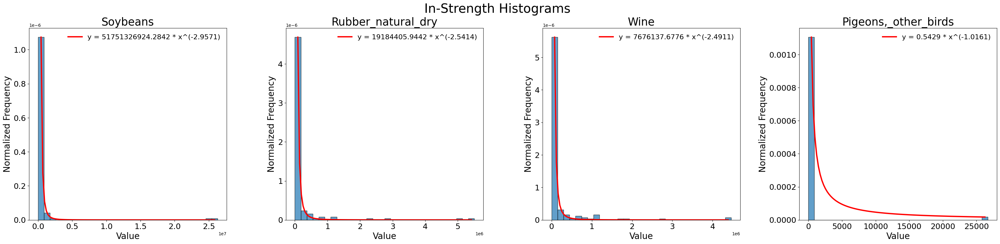

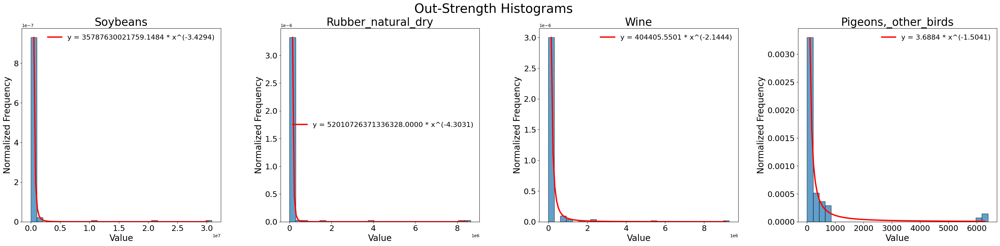

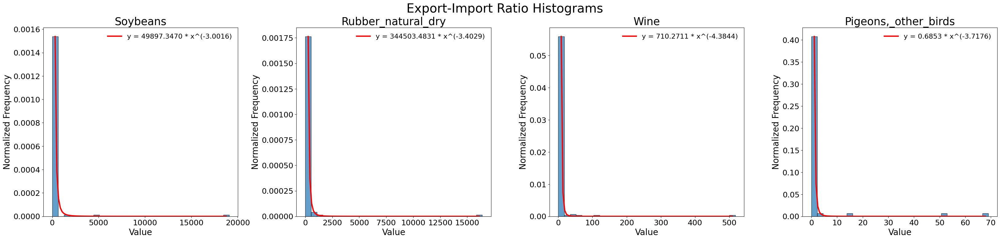

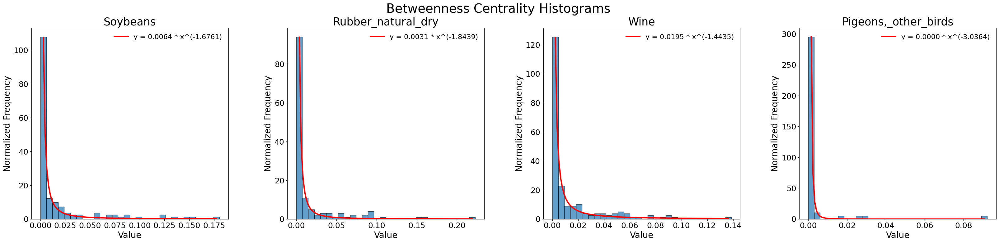

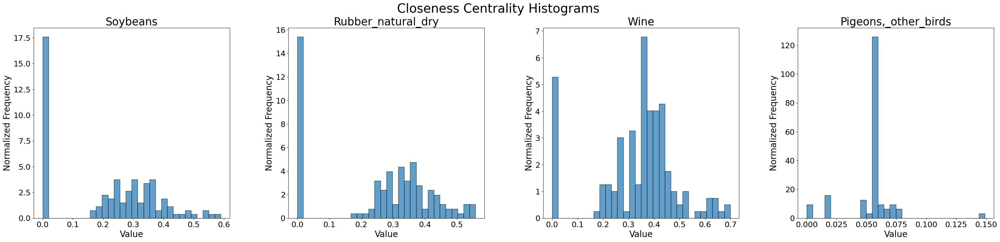

In [ ]:
hist(in_out_strengths, products, "In-Strength", 1, 4)
hist(in_out_strengths, products, "Out-Strength", 1, 4)
hist(in_out_strengths, products, "Export-Import Ratio", 1, 4)
hist(betweenness_centralities, products, "Betweenness Centrality", 1, 4)
hist(closeness_centralities, products, "Closeness Centrality", 1, 4)



##### Barplots

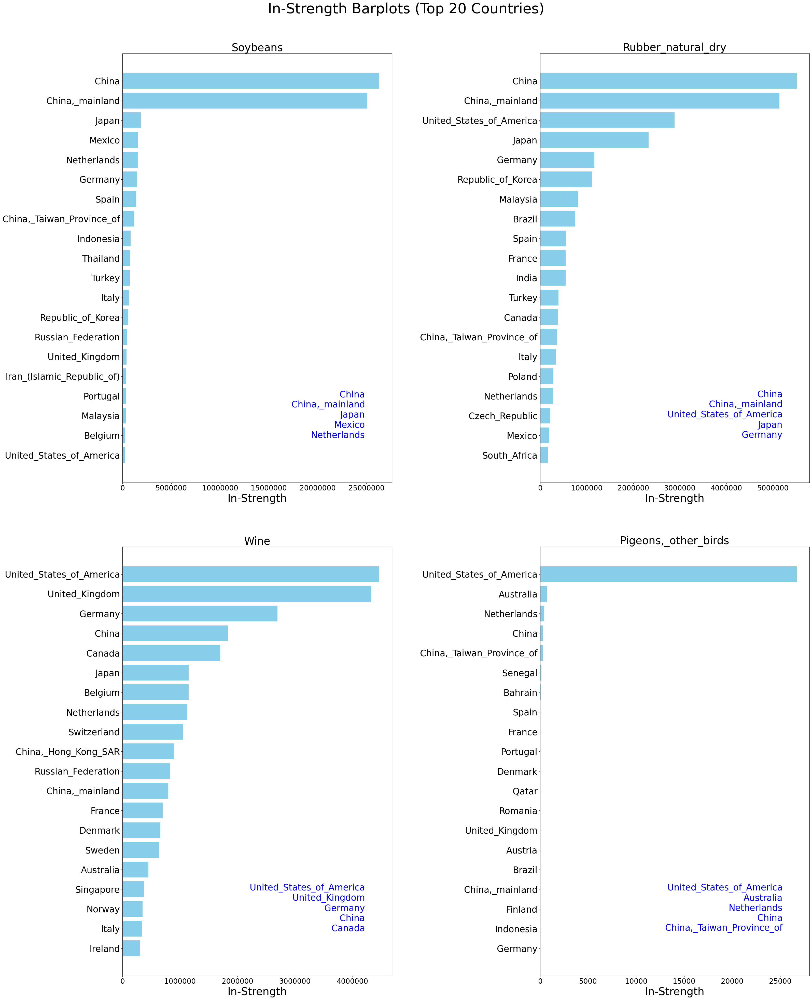

In [ ]:
bar(in_out_strengths, products, "In-Strength", 2, 2)

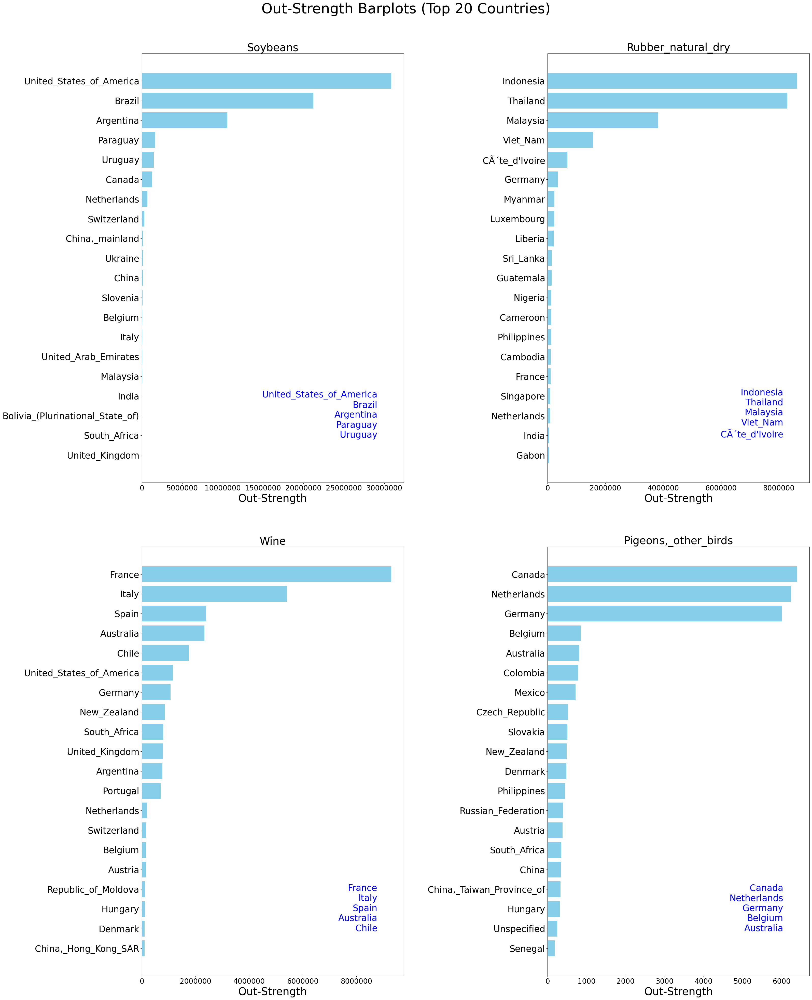

In [ ]:
bar(in_out_strengths, products, "Out-Strength", 2, 2)

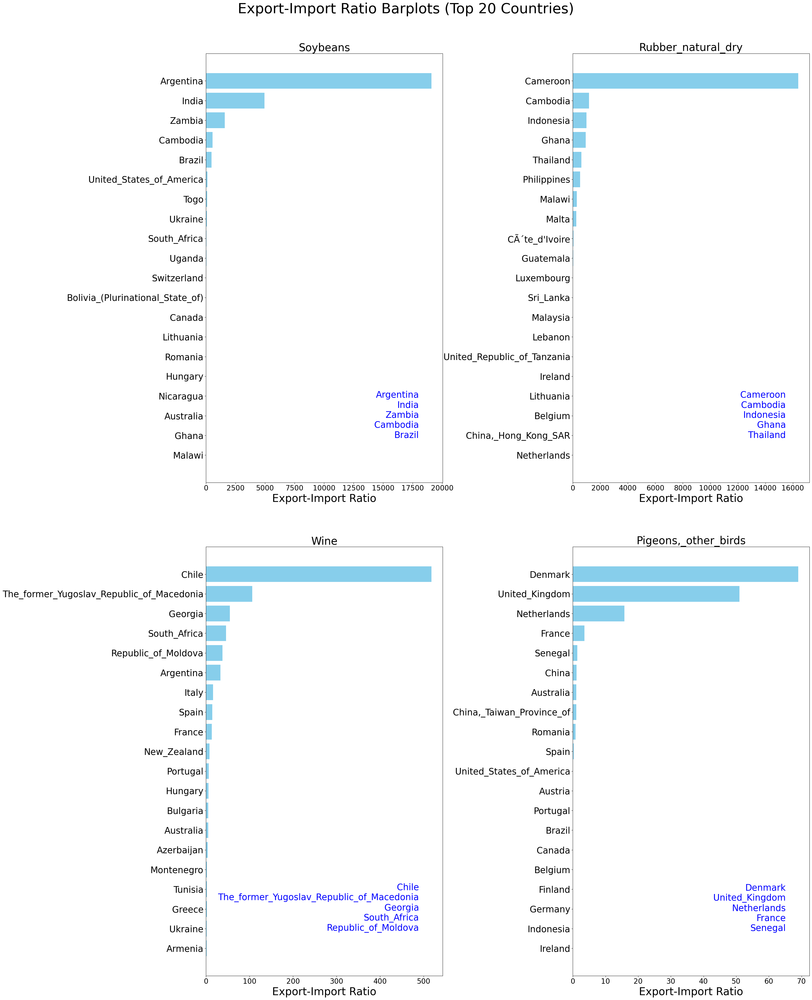

In [ ]:
bar(in_out_strengths, products, "Export-Import Ratio", 2, 2)

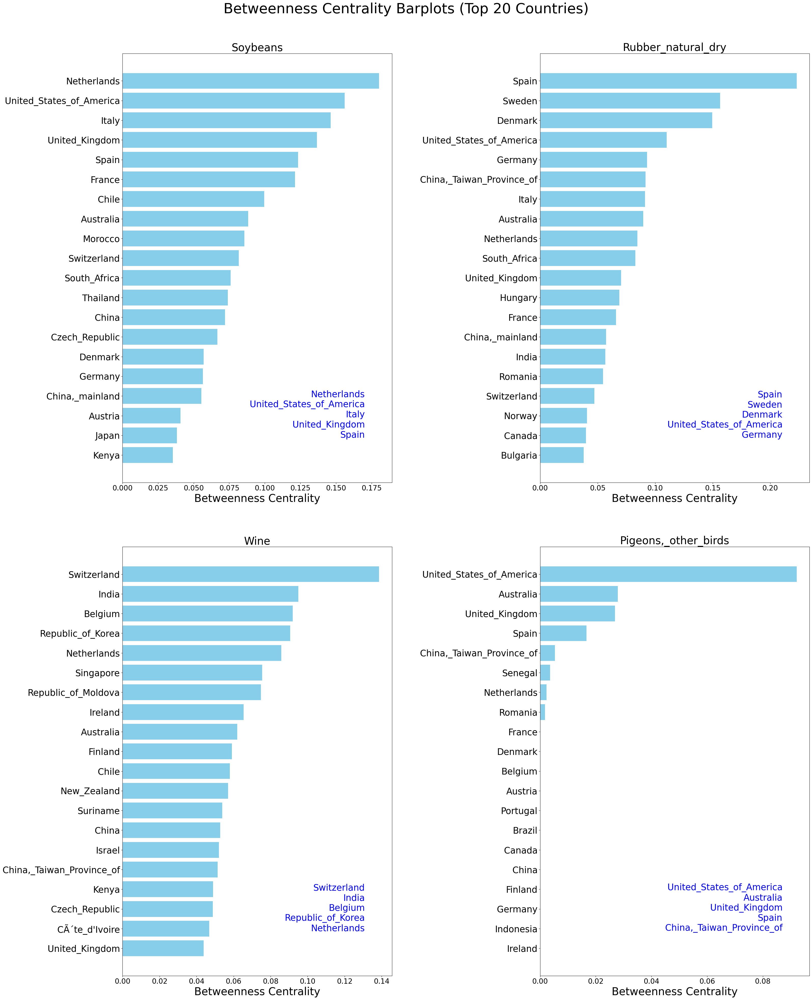

In [ ]:
bar(betweenness_centralities, products, "Betweenness Centrality", 2, 2)

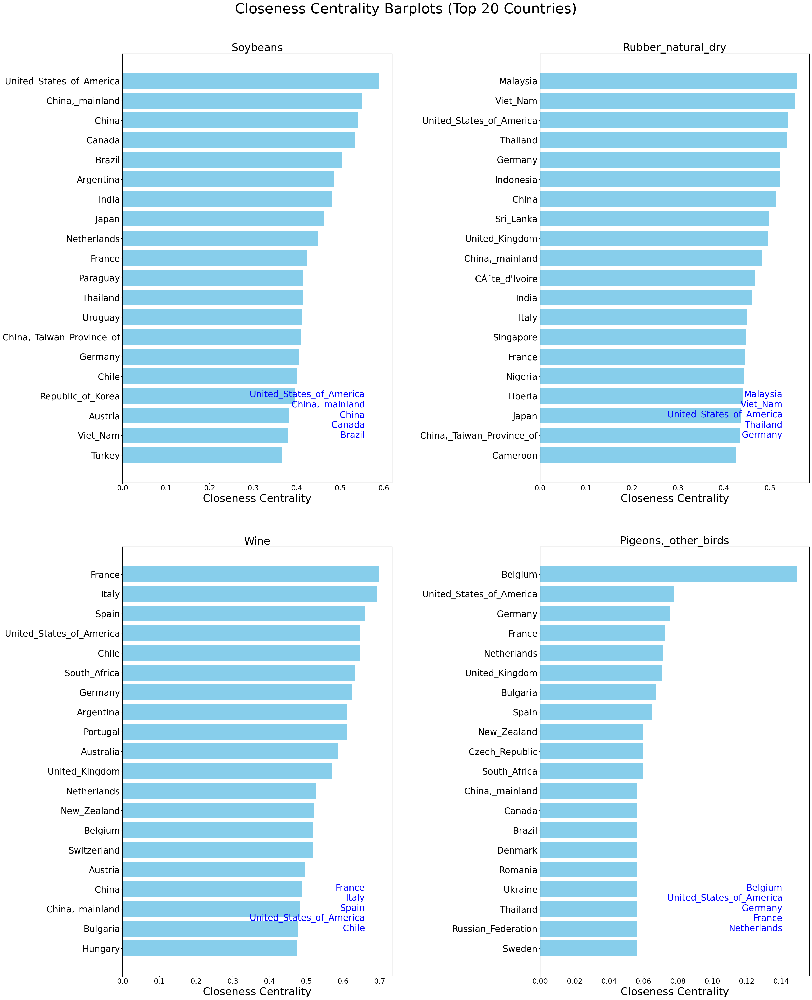

In [ ]:
bar(closeness_centralities, products, "Closeness Centrality", 2, 2)

#### Summed and Standardized Contributions by Country

Pascal's Presentation

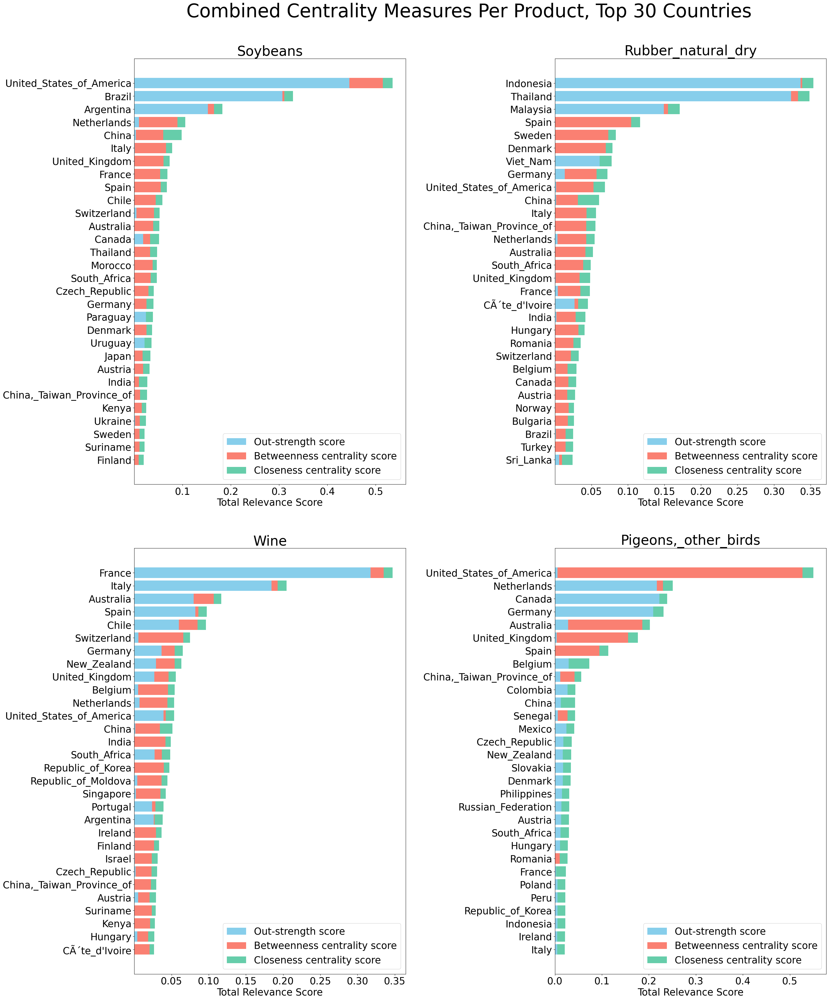

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd


top_countries = []

for i in range(len(products)):
    product = products[i]

    in_out_strengths[product]["Out-Strength Standardized"] = in_out_strengths[product]["Out-Strength"] / in_out_strengths[product]["Out-Strength"].sum()
    betweenness_centralities[product]["Betweenness Centrality Standardized"] = betweenness_centralities[product]["Betweenness Centrality"] / betweenness_centralities[product]["Betweenness Centrality"].sum()
    closeness_centralities[product]["Closeness Centrality Standardized"] = closeness_centralities[product]["Closeness Centrality"] / closeness_centralities[product]["Closeness Centrality"].sum()

    product_data = pd.DataFrame({
        'Country': in_out_strengths[product]["Country"],
        'Out-Strength': in_out_strengths[product]["Out-Strength Standardized"],
        'Betweenness Centrality': betweenness_centralities[product]["Betweenness Centrality Standardized"],
        'Closeness Centrality': closeness_centralities[product]["Closeness Centrality Standardized"]
    })


    product_data['Total Contribution'] = product_data['Out-Strength'] + product_data['Betweenness Centrality'] + product_data['Closeness Centrality']


    china_row = product_data[product_data['Country'] == 'China']
    china_mainland_row = product_data[product_data['Country'] == 'China,_mainland']


    product_data.loc[product_data['Country'] == 'China', ['Out-Strength', 'Betweenness Centrality', 'Closeness Centrality', 'Total Contribution']] += \
        china_mainland_row[['Out-Strength', 'Betweenness Centrality', 'Closeness Centrality', 'Total Contribution']].values[0]

    # Remove "China.,_mainland"
    product_data = product_data[product_data['Country'] != 'China,_mainland']
    # Remove "Unspecified"
    product_data = product_data[product_data['Country'] != 'Unspecified']
    top_countries.append(product_data.nlargest(30, 'Total Contribution'))

#fix colors, figure size, and font size
fig, axes = plt.subplots(2, 2, figsize=(32, 40))
fig.suptitle("Combined Centrality Measures Per Product, Top 30 Countries", fontsize = 48)
ax = axes.ravel()

for i in range(len(products)):
    product_data = top_countries[i]


    product_data = product_data.sort_values('Total Contribution', ascending=True)


    ax[i].barh(product_data["Country"], product_data["Out-Strength"], color="skyblue", label="Out-strength score")
    ax[i].barh(product_data["Country"], product_data["Betweenness Centrality"], color="salmon",
              label="Betweenness centrality score", left=product_data["Out-Strength"])
    ax[i].barh(product_data["Country"], product_data["Closeness Centrality"], color="mediumaquamarine",
              label="Closeness centrality score", left=product_data["Out-Strength"] + product_data["Betweenness Centrality"])


    ax[i].set_yticks(range(len(product_data["Country"])))
    ax[i].set_yticklabels(product_data["Country"], fontsize=25)
    ax[i].set_xlabel("Total Relevance Score", fontsize=25)
    ax[i].tick_params(axis='x', labelsize=25)
    ax[i].set_title(f"{products[i]}", fontsize=35)

    ax[i].legend(loc='lower right', fontsize=25)
#Adjusted parameters here as well
plt.subplots_adjust(top=0.93, hspace=0.15, wspace=0.55)



## Country-By-Country Analysis

### Data Stratification

In [ ]:
country_centralities = {}
for country_number, country in nodedict.items():
  country_centralities[country] = {"Betweenness Centrality": [], "Closeness Centrality": [],
                                   "In-Strength": [], "Out-Strength": [], "Export-Import Ratio": []}

for product, graph in graphs.items():
  for country_number, country in nodedict.items():

    # extract specific measure per country for the given layer
    bc = betweenness_centralities[product].loc[betweenness_centralities[product]["Country"] == country, "Betweenness Centrality"]
    closeness = closeness_centralities[product].loc[closeness_centralities[product]["Country"] == country, "Closeness Centrality"]
    exp = in_out_strengths[product].loc[in_out_strengths[product]["Country"] == country, "Out-Strength"]
    imp = in_out_strengths[product].loc[in_out_strengths[product]["Country"] == country, "In-Strength"]
    ratio = in_out_strengths[product].loc[in_out_strengths[product]["Country"] == country, "Export-Import Ratio"]

    # append to respective dictionary location
    if not bc.empty:
      bc = bc.iloc[0]
      country_centralities[country]["Betweenness Centrality"].append(bc)
    if not closeness.empty:
      closeness = closeness.iloc[0]
      country_centralities[country]["Closeness Centrality"].append(closeness)
    if not exp.empty:
      exp = exp.iloc[0]
      country_centralities[country]["Out-Strength"].append(exp)
    if not imp.empty:
      imp = imp.iloc[0]
      country_centralities[country]["In-Strength"].append(imp)
    if not ratio.empty:
      ratio = ratio.iloc[0]
      country_centralities[country]["Export-Import Ratio"].append(ratio)


### Aggregate Measure Visualization



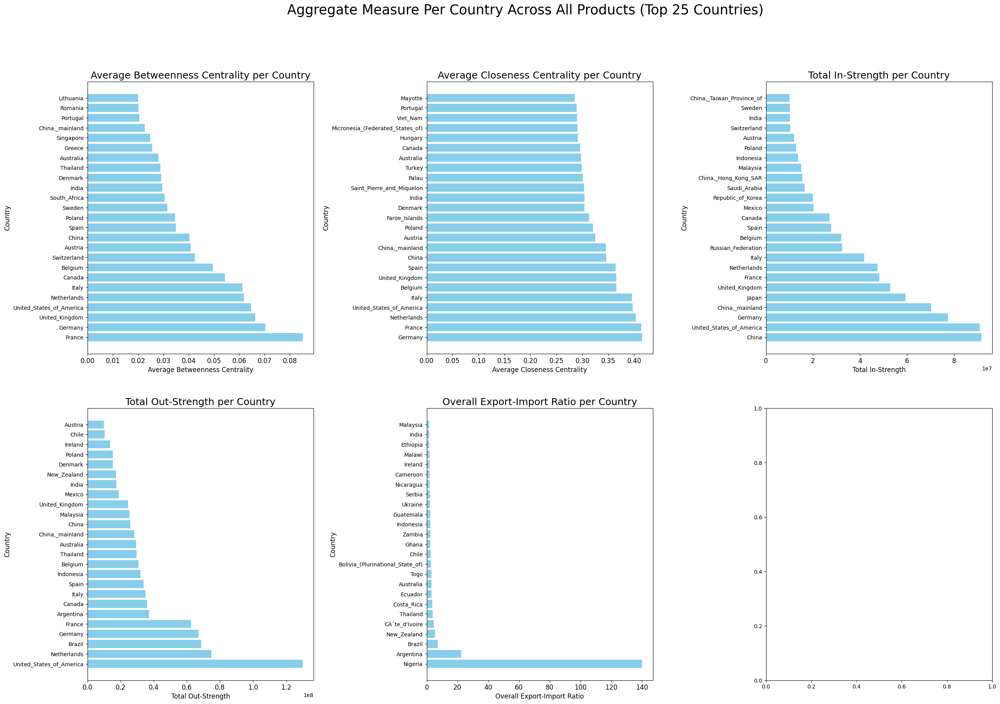

In [ ]:
import numpy as np

measures = ["Betweenness Centrality", "Closeness Centrality", "In-Strength", "Out-Strength", "Export-Import Ratio"]

fig, axes = plt.subplots(2,3,figsize = (30,20))
fig.suptitle("Aggregate Measure Per Country Across All Products (Top 25 Countries)", fontsize = 25)
ax = axes.ravel()

for i, measure in enumerate(measures):
  # values stores aggregated data in the form of values[country] = aggregated measure
  # this is iterated over each measure

  values = {}
  if measure == "Betweenness Centrality" or measure == "Closeness Centrality":
    # value stored is average centrality
    values = {country: np.mean(country_centralities[country][measure]) for country in country_centralities.keys()}
  if measure == "In-Strength" or measure == "Out-Strength":
    # value stored is total in / out strength
    values = {country: np.sum(country_centralities[country][measure]) for country in country_centralities.keys()}
  if measure == "Export-Import Ratio":
    # value stored is overall export-import ratio with exception for countries that do not import anything
    for country in country_centralities.keys():
      if np.sum(country_centralities[country]["In-Strength"]) == 0:
          values[country] = 0
      else:
          values[country] = float(np.sum(country_centralities[country]["Out-Strength"]) / np.sum(country_centralities[country]["In-Strength"]))

  # Sort countries by max value for the given measure (descending order)
  sorted_countries = sorted(values.keys(), key=lambda c: values[c], reverse=True)
  sorted_values = [values[c] for c in sorted_countries]

  # plot top 25 countries
  ax[i].barh(sorted_countries[:25], sorted_values[:25], color="skyblue", height = 0.8, alpha = 1)

  ax[i].set_yticks(range(len(sorted_countries[:25])))
  ax[i].set_yticklabels(sorted_countries[:25], fontsize=10)
  ax[i].set_ylabel("Country", fontsize= 12)
  ax[i].tick_params(axis = 'x', labelsize = 12)

  # appropriate naming
  if measure == "Betweenness Centrality" or measure == "Closeness Centrality":
    ax[i].set_xlabel(f"Average {measure}", fontsize=12)
    ax[i].set_title(f"Average {measure} per Country", fontsize=18)

  if measure == "In-Strength" or measure == "Out-Strength":
    ax[i].set_xlabel(f"Total {measure}", fontsize=12)
    ax[i].set_title(f"Total {measure} per Country", fontsize=18)

  if measure == "Export-Import Ratio":
    ax[i].set_xlabel(f"Overall {measure}", fontsize=12)
    ax[i].set_title(f"Overall {measure} per Country", fontsize=18)


plt.subplots_adjust(wspace = 0.5)



## Most Imported/Exported Goods

### By Country

In [ ]:
country_faves = {}


for product in graphs.keys():
  data = in_out_strengths[product]
  for country in data["Country"]:
    if country not in country_faves.keys():
      country_faves[country] = {"Import": product, "Export": product}
    else:
      # in/out strength values for current layer
      current_import = data.loc[data["Country"] == country, "In-Strength"].iloc[0]
      current_export = data.loc[data["Country"] == country, "Out-Strength"].iloc[0]

      # extract dataframe of previous value
      old_import_layer = in_out_strengths[country_faves[country]["Import"]]
      old_export_layer = in_out_strengths[country_faves[country]["Export"]]

      # update product with most imports/exports for the given country
      if current_import > old_import_layer.loc[old_import_layer["Country"] == country, "In-Strength"].iloc[0]:
        country_faves[country]["Import"] = product
      if current_import > old_import_layer.loc[old_import_layer["Country"] == country, "Out-Strength"].iloc[0]:
        country_faves[country]["Export"] = product


#### Most Imported/Exported for High Ratio Countries

In [ ]:
high_ratio_countries = ["Nigeria", "Argentina", "Brazil", "New_Zealand", "Togo"]
for country in high_ratio_countries:
  print(country)
  print(country_faves[country])

Nigeria
{'Import': 'Sugar,_nes', 'Export': 'Sugar,_nes'}
Argentina
{'Import': 'Bananas', 'Export': 'Silk_raw'}
Brazil
{'Import': 'Wheat', 'Export': 'Rubber_natural_dry'}
New_Zealand
{'Import': 'Food_prep_nes', 'Export': 'Food_prep_nes'}
Togo
{'Import': 'Food_prep_nes', 'Export': 'Whey,_condensed'}


### By Product

#### Restructured Data

In [ ]:
layers = {}

for country in country_faves.keys():
    # top import/export layer for a given country
    import_layer = country_faves[country]['Import']
    export_layer = country_faves[country]['Export']

    # create keys for top import/export layer for the country to the dictionary if they are not already present
    if import_layer not in layers:
        layers[import_layer] = {'Import': [], 'Export': []}
    if export_layer not in layers:
        layers[export_layer] = {'Import': [], 'Export': []}

    # add country name to as having the given layer as its most imported / most exported product
    layers[import_layer]['Import'].append(country)
    layers[export_layer]['Export'].append(country)

#### Most Popular Products

##### Bar Chart

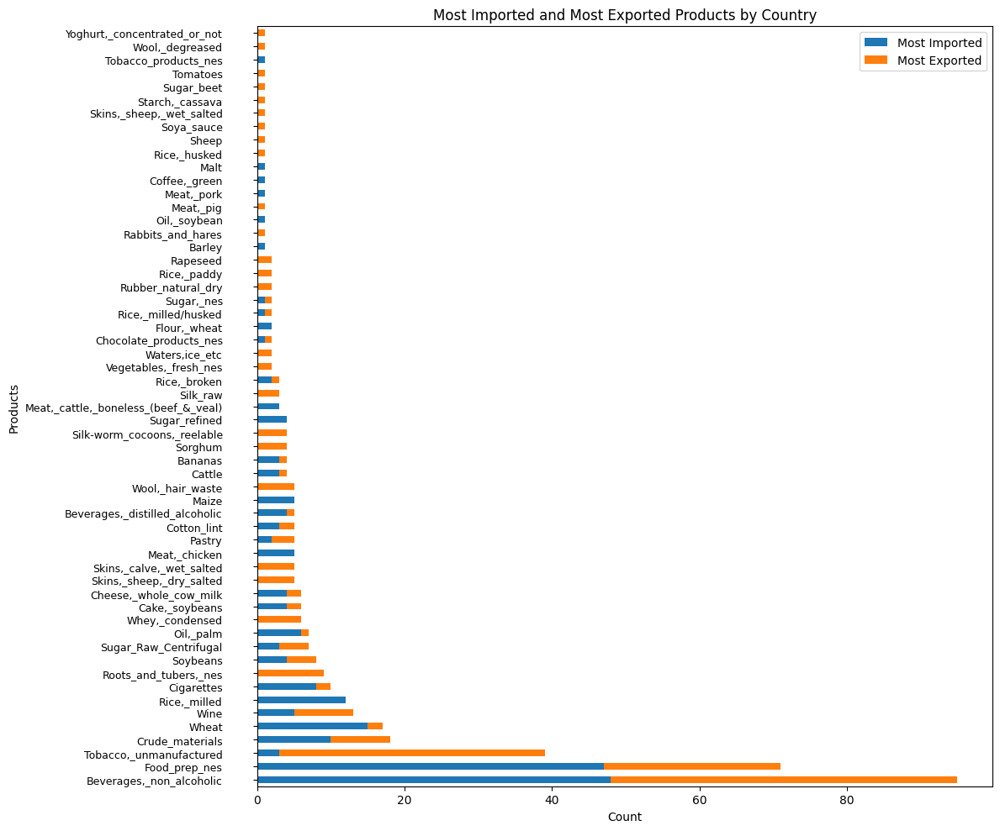

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# convert country dict to df
country_faves_df = pd.DataFrame.from_dict(country_faves, orient='index')

# get counts for each product in most imported and most exported columns
import_counts = country_faves_df['Import'].value_counts()
export_counts = country_faves_df['Export'].value_counts()

# store counts in df
product_counts = pd.DataFrame({
    'Most Imported': import_counts,
    'Most Exported': export_counts
}).fillna(0)

product_counts['Total'] = product_counts['Most Imported'] + product_counts['Most Exported']
product_counts_sorted = product_counts.sort_values('Total', ascending=False)

product_counts_sorted.drop(columns='Total').plot(kind='barh', stacked=True, figsize=(12, 10))

plt.title('Most Imported and Most Exported Products by Country')
plt.xlabel('Count')
plt.ylabel('Products')
plt.tick_params(axis='y', labelsize=9, pad=26)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


##### Top Countries for Niche Products

In [ ]:
niche_products = ["Pastry", "Rice,_broken", "Yoghurt,_concentrated_or_not", "Rabbits_and_hares", "Cotton_lint",
                  "Skins,_sheep,_dry_salted", "Cigarettes", "Soya_sauce"]
for product in niche_products:
  print(product)
  print(f"Highest imports: {layers[product]['Import']}")
  print(f"Highest exports: {layers[product]['Export']}")
  print("\n")

Pastry
Highest imports: ['Oman', 'Andorra']
Highest exports: ['France', 'Malta', 'Andorra']


Rice,_broken
Highest imports: ['Senegal', 'Gambia']
Highest exports: ['Zambia']


Yoghurt,_concentrated_or_not
Highest imports: []
Highest exports: ['Afghanistan']


Rabbits_and_hares
Highest imports: []
Highest exports: ['Maldives']


Cotton_lint
Highest imports: ['Turkey', 'Djibouti', 'Lesotho']
Highest exports: ['Djibouti', 'Lesotho']


Skins,_sheep,_dry_salted
Highest imports: []
Highest exports: ['Lebanon', 'Republic_of_Korea', 'Kyrgyzstan', 'Mexico', 'Syrian_Arab_Republic']


Cigarettes
Highest imports: ['Italy', 'Spain', 'Cambodia', 'Albania', 'Republic_of_Moldova', 'Belize', 'Kiribati', 'Tuvalu']
Highest exports: ['Kiribati', 'Tuvalu']


Soya_sauce
Highest imports: []
Highest exports: ['Tonga']




##### Top Countries for Chosen Products

In [61]:
for product in products:
  print(product)
  if product in layers.keys():
    print(f"Highest imports: {layers[product]['Import']}")
    print(f"Highest exports: {layers[product]['Export']}")
  else:
    print(f"Highest imports: []")
    print(f"Highest exports: []")
  print("\n")

Soybeans
Highest imports: ['China', 'China,_mainland', 'Mexico', 'Portugal']
Highest exports: ['Norway', 'Albania', 'Peru', 'Barbados']


Rubber_natural_dry
Highest imports: []
Highest exports: ['Slovakia', 'Brazil']


Wine
Highest imports: ['Switzerland', 'United_Kingdom', 'Lithuania', 'Latvia', 'China,_Macao_SAR']
Highest exports: ['Canada', 'Germany', 'Singapore', 'Sweden', 'United_Kingdom', 'Finland', 'Estonia', 'Iceland']


Pigeons,_other_birds
Highest imports: []
Highest exports: []




## Assortativity Visualization

/usr/local/lib/python3.11/dist-packages/networkx/algorithms/assortativity/correlation.py:282: RuntimeWarning: invalid value encountered in scalar divide
  r = (t - s) / (1 - s)


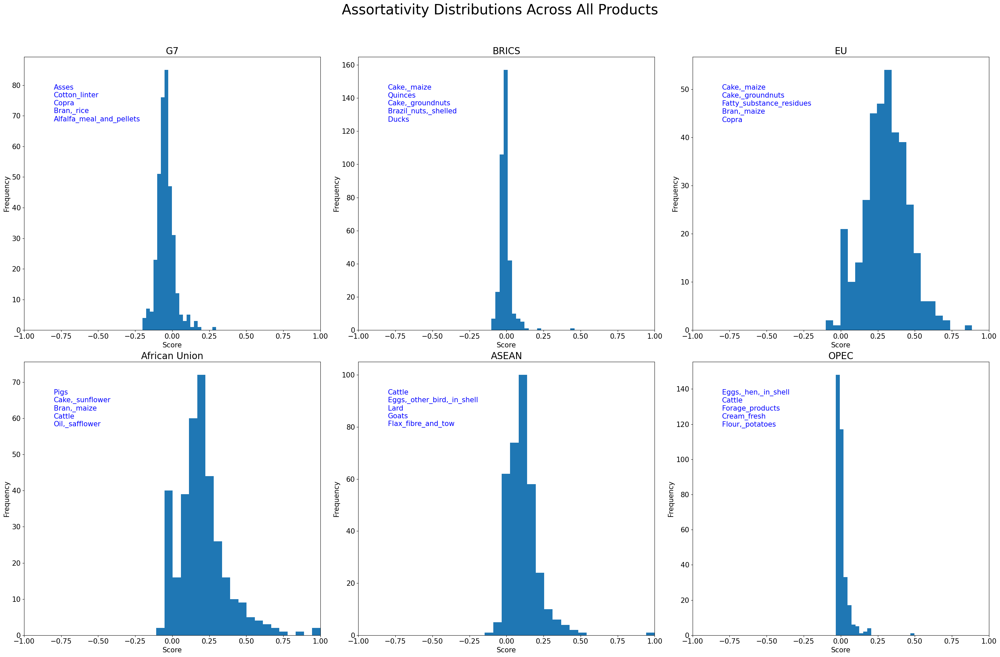

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

# Define country groups
g7 = ["Japan", "United_Kingdom", "Italy", "Canada", "France", "Germany", "United_States_of_America"]
brics = ["Brazil", "Russian_Federation", "India", "China", "South_Africa"]
eu = ["Austria", "Belgium", "Bulgaria", "Cyprus", "Czech Republic", "Denmark", "Estonia", "Finland",
      "France", "Germany", "Greece", "Hungary", "Ireland", "Italy", "Latvia", "Lithuania", "Luxembourg",
      "Malta", "Netherlands", "Poland", "Portugal", "Romania", "Slovakia", "Slovenia", "Spain", "Sweden",
      "United_Kingdom"]
african_union = ["Algeria", "Angola", "Benin", "Botswana", "Burkina_Faso", "Burundi", "Cabo_Verde", "Cameroon",
                 "Central_African_Republic", "Chad", "Comoros", "Congo", "Democratic_Republic_of_the_Congo", "Djibouti",
                 "Egypt", "Equatorial_Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
                 "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
                 "Mauritania", "Mauritius", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao_Tome_and_Principe",
                 "Senegal", "Seychelles", "Sierra Leone", "Somalia", "South_Africa", "Sudan", "Togo", "Tunisia", "Uganda",
                 "Zambia", "Zimbabwe"]
asean = ["Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia", "Myanmar", "Philippines", "Singapore", "Thailand",
         "Vietnam"]
opec = ["Algeria", "Angola", "Ecuador", "Iran", "Iraq", "Kuwait", "Libya", "Nigeria", "Saudi_Arabia", "United_Arab_Emirates",
        "Venezuela"]

# Country groups
SimilarCountries = [g7, brics, eu, african_union, asean, opec]
groups = ["G7", "BRICS", "EU", "African Union", "ASEAN", "OPEC"]

# Initialize scores list
scores = [list() for _ in range(len(SimilarCountries))]


# Calculate assortativity for each group and product
for product in graphs.keys():
    for i, group in enumerate(SimilarCountries):
        G = graphs[product]
        AssortG = nx.DiGraph()

        # Add nodes with color attribute based on whether they are in the group
        for n in G.nodes():
            if n in group:
                AssortG.add_node(n, color="blue")
            else:
                AssortG.add_node(n, color="red")

        e = G.edges()
        AssortG.add_edges_from(e)

        assortativity_score = nx.attribute_assortativity_coefficient(AssortG, "color")

        scores[i].append((product, assortativity_score))

fig, axes = plt.subplots(2, 3, figsize=(30, 20))
ax = axes.ravel()

for i in range(6):
    assortativity_scores = [x[1] for x in scores[i]]

    ax[i].hist(assortativity_scores, bins=20)
    ax[i].set_title(f"{groups[i]}", fontsize=20)
    ax[i].set_xlim(-1, 1)
    ax[i].tick_params(axis='x', labelsize=15)
    ax[i].tick_params(axis='y', labelsize=15)
    ax[i].set_xlabel("Score", fontsize=15)
    ax[i].set_ylabel("Frequency", fontsize=15)

    # list top 5 products with highest assortativity
    sorted_scores = sorted(scores[i], key=lambda x: x[1], reverse=True)
    top_products = "\n".join([f"{product}" for product, score in sorted_scores[:5]])

    ax[i].text(0.1, 0.9, top_products, transform=ax[i].transAxes, fontsize=15, ha='left', va='top', color='blue')

fig.suptitle("Assortativity Distributions Across All Products", fontsize=30)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()


# Anton's Assessment

## Data Processing

In [ ]:
import networkx as nx
import pandas as pd

layerdict = {}
nodedict = {}
graphs = {}

with open('fao_trade_layers.txt','r') as l:
  next(l)
  for line in l:
    parts = line.strip().split(' ', 1)
    if len(parts) == 2:
      layerID, layerLabel = parts
      layerdict[int(layerID)] = layerLabel

with open('fao_trade_nodes.txt','r') as l:
  next(l)
  for line in l:
    parts = line.strip().split(' ', 1)
    if len(parts) == 2:
      nodeID, nodeLabel = parts
      nodedict[int(nodeID)] = nodeLabel



df_codes = pd.read_excel("iso_3digit_alpha_country_codes.xls")
df_codes.columns = df_codes.columns.str.strip()
country_code_map = dict(zip(df_codes["Definition"], df_codes["Code Value"]))

# Convert nodedict using the mapping, keeping names unchanged if no match
nodedict_short = {key: country_code_map.get(value, value) for key, value in nodedict.items()}

with open('fao_trade_multiplex.edges', 'r') as f:
  for line in f:
    parts = line.strip().split()
    if len(parts) != 4:
      continue
    layer = layerdict[int(parts[0])]
    node1 = int(parts[1])
    node2 = int(parts[2])
    weight = float(parts[3])

    if layer not in graphs:
      graphs[layer] = nx.DiGraph()

    graphs[layer].add_edge(nodedict_short[node1], nodedict_short[node2], weight=weight)

#access each layer's network by graphs[food_product_name], ex: graphs["Peppermint"]


## Product Scoring

In [ ]:
#Top Products by sum of edge weights
prod_weight = dict()
for product in graphs.keys():
  G = graphs[product]
  nbr = G.size(weight = "weight")
  prod_weight.update({product: nbr})
top_products = sorted(prod_weight, key=prod_weight.get, reverse=True)
top_products = top_products[0:10]
top_weights = []
for prod in top_products:
  top_weights.append(prod_weight.get(prod))

<ipython-input-29-32402b371dab>:83: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(yvector, fontsize=17)


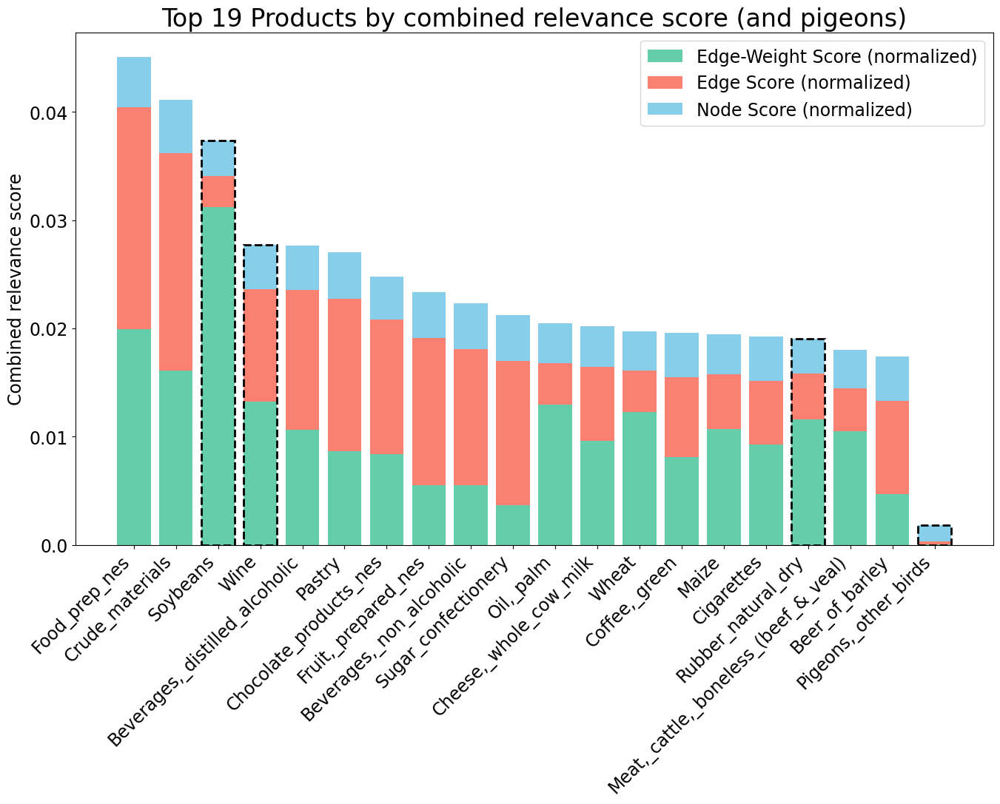

In [ ]:
from matplotlib import patches

totalweight = 0
totaledge = 0
totalnodes = 0

nbr_prods= 0

for i in prod_weight:
  totalweight = totalweight + prod_weight[i]
for i in graphs:
  G = graphs[i]
  totaledge = totaledge + G.number_of_edges()
  totalnodes = totalnodes + G.number_of_nodes()

weightscore = {}

for prod in layerdict:
  G = graphs[layerdict[prod]]
  weightscore[layerdict[prod]] = 0.5*prod_weight[layerdict[prod]]/totalweight


edgescore = {}

for prod in layerdict:
  G = graphs[layerdict[prod]]
  edgescore[layerdict[prod]] = G.number_of_edges()/totaledge


nodescore = {}

for prod in layerdict:
  G = graphs[layerdict[prod]]
  nodescore[layerdict[prod]] = G.number_of_nodes()/totalnodes


productscore = {}

for prod in layerdict:
  G = graphs[layerdict[prod]]
  productscore[layerdict[prod]] = weightscore[layerdict[prod]] + edgescore[layerdict[prod]] + nodescore[layerdict[prod]]



top_product = sorted(productscore, key=productscore.get, reverse=True)
top_product = top_product[00:19]
#add pigeons
top_product.append('Pigeons,_other_birds')


# Plot
weights = [weightscore[p] for p in top_product]
edges = [edgescore[p] for p in top_product]
nodes = [nodescore[p] for p in top_product]

x = np.arange(len(top_product))

fig, ax = plt.subplots(figsize=(16, 9))

ax.bar(x, weights, color="mediumaquamarine", label="Edge-Weight Score (normalized)")
ax.bar(x, edges, bottom=weights, color="salmon", label="Edge Score (normalized)")
ax.bar(x, nodes, bottom=np.array(weights) + np.array(edges), color="skyblue", label="Node Score (normalized)")

highlighted_products = {"Wine", "Soybeans", "Rubber_natural_dry", "Pigeons,_other_birds"}
for i, prod in enumerate(top_product):
    if prod in highlighted_products:
        total_height = weights[i] + edges[i] + nodes[i]
        rect = patches.Rectangle(
            (x[i] - 0.4, 0),  # Position: align with the bar
            0.8,  # Width of the bar
            total_height,  # Height of the bar
            linewidth=2,
            edgecolor="black",
            linestyle="dashed",
            facecolor="none",
        )
        ax.add_patch(rect)

yvector=[0.00,0.01,0.02,0.03,0.04]
ax.set_xticks(x)
ax.set_xticklabels(top_product, rotation=45, ha="right", fontsize=17)
ax.set_ylabel("Combined relevance score", fontsize=17)
ax.set_yticklabels(yvector, fontsize=17)
ax.set_title("Top 19 Products by combined relevance score (and pigeons)", fontsize=24)

plt.legend(prop={'size': 17})
plt.show()


## Top 2 Trading Partners

### Plot Function

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import pandas as pd
import matplotlib.legend as mlegend
from matplotlib.legend_handler import HandlerPatch

def plot_simplified_network(product_name):

  #OECD (Cold-war era, Pre '91)
  oecd_fullname = {"Norway", "Greece", "Turkey", "Germany", "Iceland", "Belgium",
          "Luxemburg", "Denmark", "Ireland", "Netherlands", "United_Kingdom",
          "France", "Austria", "United_States_of_America", "Portugal",
          "Switzerland", "Canada", "Spain", "Sweden", "Finland", "Japan", "Italy",
          "Australia", "New_Zealand"}
  oecd = {"NOR", "GRC", "TUR", "DEU", "ISL", "BEL",
          "LUX", "DNK", "IRL", "NLD", "GBR",
          "FRA", "AUT", "USA", "PRT",
          "CHE", "CAN", "ESP", "SWE", "FIN", "JPN", "ITA",
          "AUS", "NZL"}

  # Input countries of similar color
  SimilarCountries = oecd

  G = graphs[product_name]
  topG = nx.DiGraph()


  for n in G.nodes():
      if n in SimilarCountries:
          color = mcolors.to_rgba("lightskyblue", alpha=1)
      else:
          color = mcolors.to_rgba("salmon", alpha=1)
      topG.add_node(n, color=color)

  edge_labels = nx.get_edge_attributes(G, "weight")
  sorted_edges = sorted(edge_labels.items(), key=lambda item: item[1], reverse = True)
  dictionary1 = {}

  for edge, weight in sorted_edges:
      if(edge[1] not in dictionary1):
        dictionary1[edge[1]] = 1
        topG.add_edge(edge[0], edge[1], weight= weight)
      elif(dictionary1.get(edge[1]) == 1):
        dictionary1[edge[1]] = 2
        topG.add_edge(edge[0], edge[1], weight= weight)

  out_degrees = dict(topG.out_degree())
  in_degrees = dict(topG.in_degree())

  isolated_nodes = [n for n in topG.nodes() if in_degrees[n] == 0 and out_degrees[n] == 0]
  isolated_nodes.append("CHN_mainland")
  topG.remove_nodes_from(isolated_nodes)


  min_degree = min(out_degrees.values()) if out_degrees else 1
  max_degree = max(out_degrees.values()) if out_degrees else 1
  node_sizes = [750 + (out_degrees[n] / max_degree) * 5000 for n in topG.nodes()]

  small_size = min(node_sizes)
  big_size = max(node_sizes)

  small_label = "Lower out-strength"
  big_label = "Higher out-strength"


  pos = nx.spring_layout(topG, k=30.0, scale = 100, seed = 26)

  node_colors = [topG.nodes[n]["color"] for n in topG.nodes()]


  plt.figure(figsize=(16, 9))
  nx.draw(topG, pos, with_labels=True, node_color=node_colors, edgecolors = 'black', linewidths = 0.8,
          node_size=node_sizes, arrows=True, width=0.5, arrowsize=15, font_size=12, edge_color = 'black')

  legend_elements = [
      mpatches.Patch(color="lightskyblue", label="OECD-'91 Country"),
      mpatches.Patch(color="salmon", label="Non-OECD-'91 Country"),
      mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=9, label=small_label),
      mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=18, label=big_label),
      #mlines.Line2D([], [], color='black', linewidth=1.5, marker='>', markersize=8, label="Trade Connection")
      #mlines.Line2D([], [], color='black', linewidth=1, label="Trade Connection")
  ]

  def make_legend_arrow(legend, orig_handle, xdescent, ydescent, width, height, fontsize):
      p = mpatches.FancyArrow(0, 0.5*height, width, 0, length_includes_head=True, head_width=0.75*height)
      return p

  arrow = plt.arrow(0,0, 0.5, 0.6, color = 'black', label='Trade Connection', )

  legend_elements.append(arrow)
  plt.legend(handles=legend_elements, loc="upper left", fontsize=18, prop={'size': 16},handler_map={mpatches.FancyArrow : HandlerPatch(patch_func=make_legend_arrow), })

  plt.title(f"{product_name} International Trade Network - Strongest Trading Partners", fontsize = 28)

  plt.show()


### Network Visualization

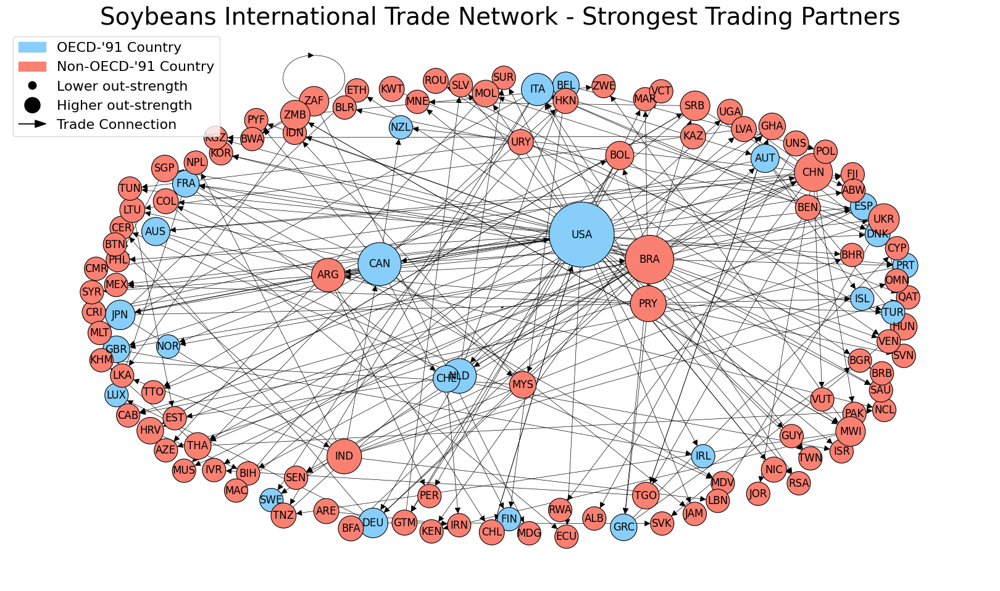

In [ ]:
plot_simplified_network(products[0])

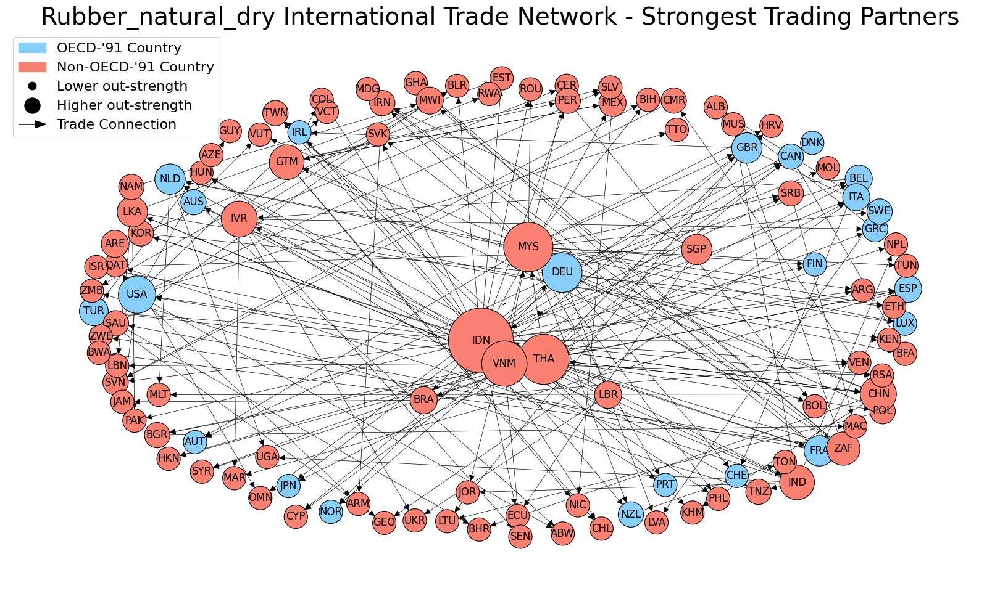

In [ ]:
plot_simplified_network(products[1])

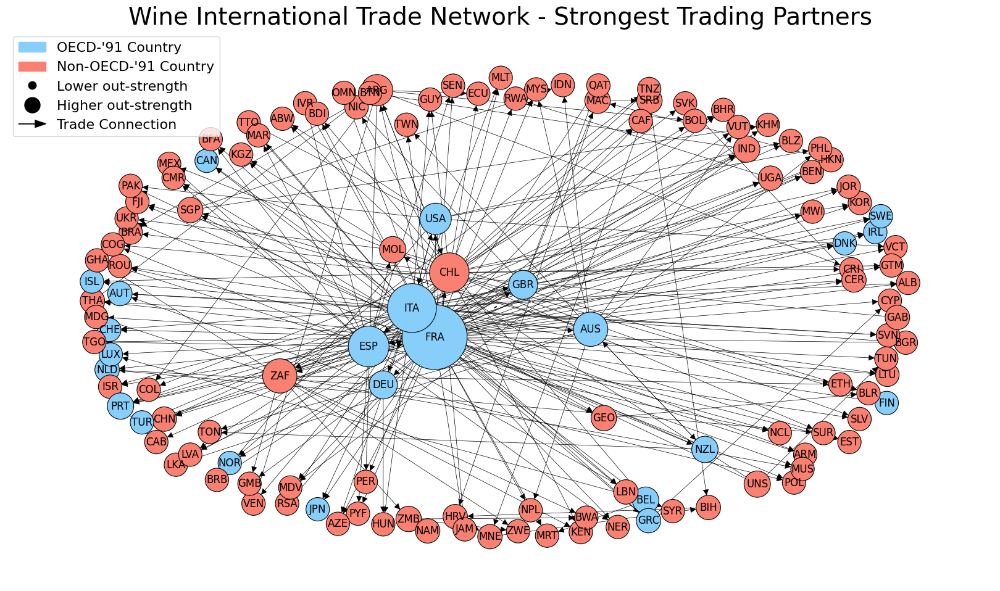

In [ ]:
plot_simplified_network(products[2])

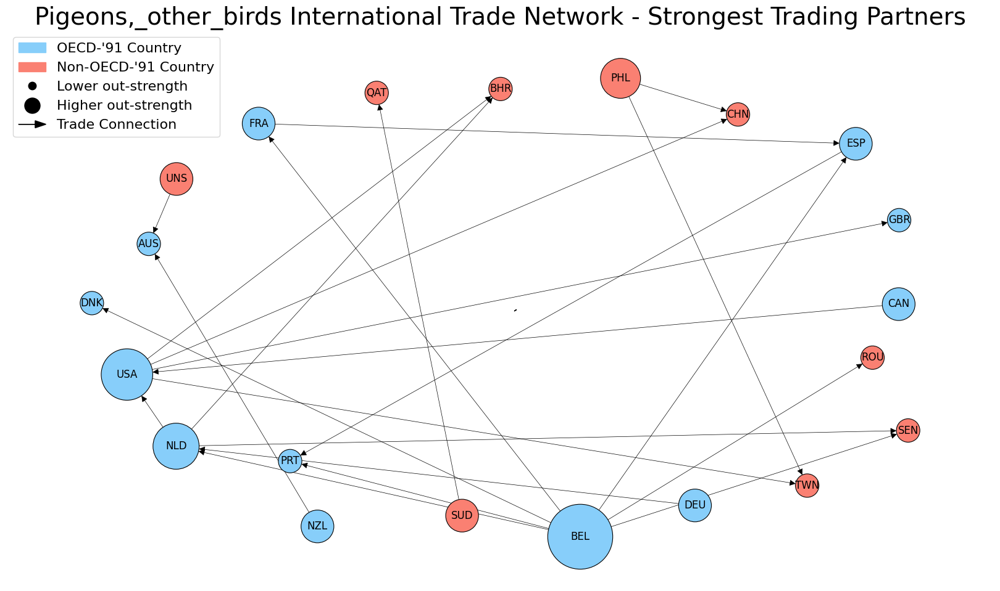

In [ ]:
plot_simplified_network(products[3])

### Modularity Comparison

#### Calculation

In [55]:
def modularity(product_name, SimilarCountries):
  G = graphs[product_name]
  all_nodes = set(G.nodes())
  partition = [set(SimilarCountries), all_nodes - set(SimilarCountries)]
  filtered_countries = set(SimilarCountries) & all_nodes
  partition = [filtered_countries, all_nodes - filtered_countries]
  print(product_name, "modularity:", nx.community.modularity(G, partition, weight='weight'))

def simplified_modularity(product_name, SimilarCountries):
  G = graphs[product_name]
  topG = nx.DiGraph()

  edge_labels = nx.get_edge_attributes(G, "weight")
  sorted_edges = sorted(edge_labels.items(), key=lambda item: item[1], reverse = True)
  dictionary1 = {}

  for edge, weight in sorted_edges:
      if(edge[1] not in dictionary1):
        dictionary1[edge[1]] = 1
        topG.add_edge(edge[0], edge[1], weight= weight)
      elif(dictionary1.get(edge[1]) == 1):
        dictionary1[edge[1]] = 2
        topG.add_edge(edge[0], edge[1], weight= weight)

  all_nodes = set(topG.nodes())
  partition = [set(SimilarCountries), all_nodes - set(SimilarCountries)]


  filtered_countries = set(SimilarCountries) & all_nodes


  partition = [filtered_countries, all_nodes - filtered_countries]

  print(product_name, "modularity (top 2 trading partners):", nx.community.modularity(topG, partition, weight='weight'))


In [56]:
for prod in products:
  modularity(prod, oecd)

print("\n")

for prod in products:
  simplified_modularity(prod, oecd)

Soybeans modularity: 0.0043707186597320286
Rubber_natural_dry modularity: 0.021411971307155424
Wine modularity: 0.03393146460347657
Pigeons,_other_birds modularity: 0.023253102036248852


Soybeans modularity (top 2 trading partners): -0.00999792521046515
Rubber_natural_dry modularity (top 2 trading partners): -0.006356593818632296
Wine modularity (top 2 trading partners): 0.05411620626822701
Pigeons,_other_birds modularity (top 2 trading partners): 0.056013029611496304


#### Visualization

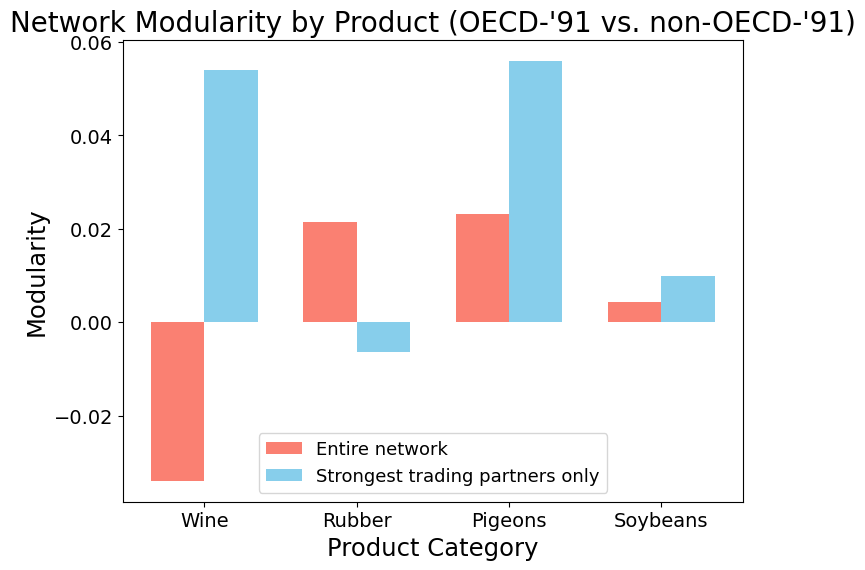

In [58]:
categories = ['Wine', 'Rubber', 'Pigeons', 'Soybeans']
overall_values = [-0.03393, 0.02141, 0.02325, 0.00437]
top_two_values = [0.05411, -0.00636, 0.05601, 0.01000]




bar_width = 0.35
x = np.arange(len(categories))


fig, ax = plt.subplots(figsize=(8, 6))
bars1 = ax.bar(x - bar_width/2, overall_values, bar_width, label='Entire network', color='salmon')
bars2 = ax.bar(x + bar_width/2, top_two_values, bar_width, label='Strongest trading partners only', color='skyblue')


ax.set_xlabel('Product Category', fontsize = 17.5)
ax.set_ylabel('Modularity', fontsize = 17.5)
ax.set_title("Network Modularity by Product (OECD-'91 vs. non-OECD-'91)", fontsize = 20)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=15, rotation=0, ha='center')
ax.tick_params(axis='both', which='major', labelsize=14)
ax.legend(loc="lower center", fontsize=15, prop={'size': 13})
plt.show()
